In [4]:
!pip install roboflow
!pip install ultralytics

In [5]:
import cv2
from google.colab.patches import cv2_imshow

from ultralytics import YOLO

In [6]:
from roboflow import Roboflow

rf = Roboflow(api_key="#########", model_format='yolov8')
project = rf.workspace("yolo-vuyol").project("animal_detection-j86fk")
dataset = project.version(1).download(location='/content/my-datasets')

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/my-datasets in yolov8:: 100%|██████████| 628/628 [00:00<00:00, 2813.02it/s]


In [31]:
model = YOLO('yolov8n.pt')

model.train(data='/content/my-datasets/data.yaml', epochs=100)

Ultralytics YOLOv8.0.159 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/my-datasets/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=

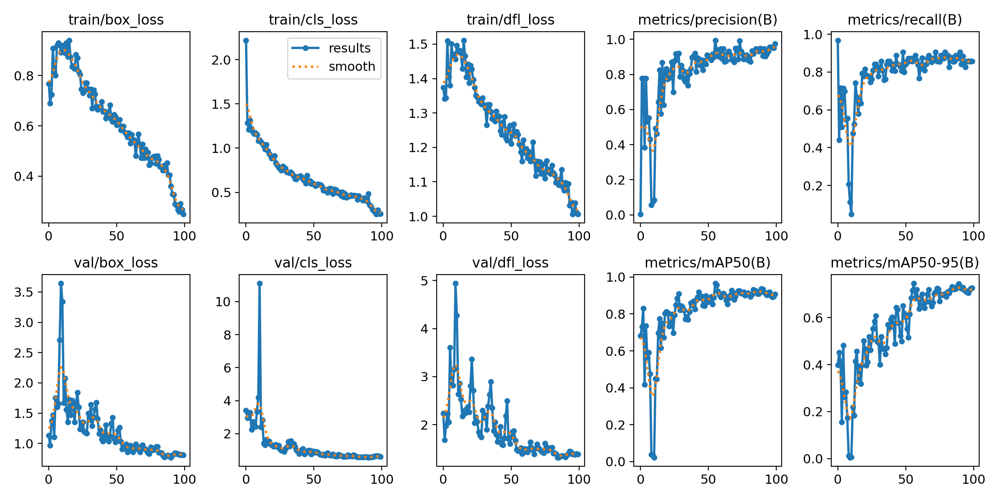

In [33]:
import cv2
from google.colab.patches import cv2_imshow

results_graph = cv2.imread('/content/runs/detect/train2/results.png')

cv2_imshow(results_graph)

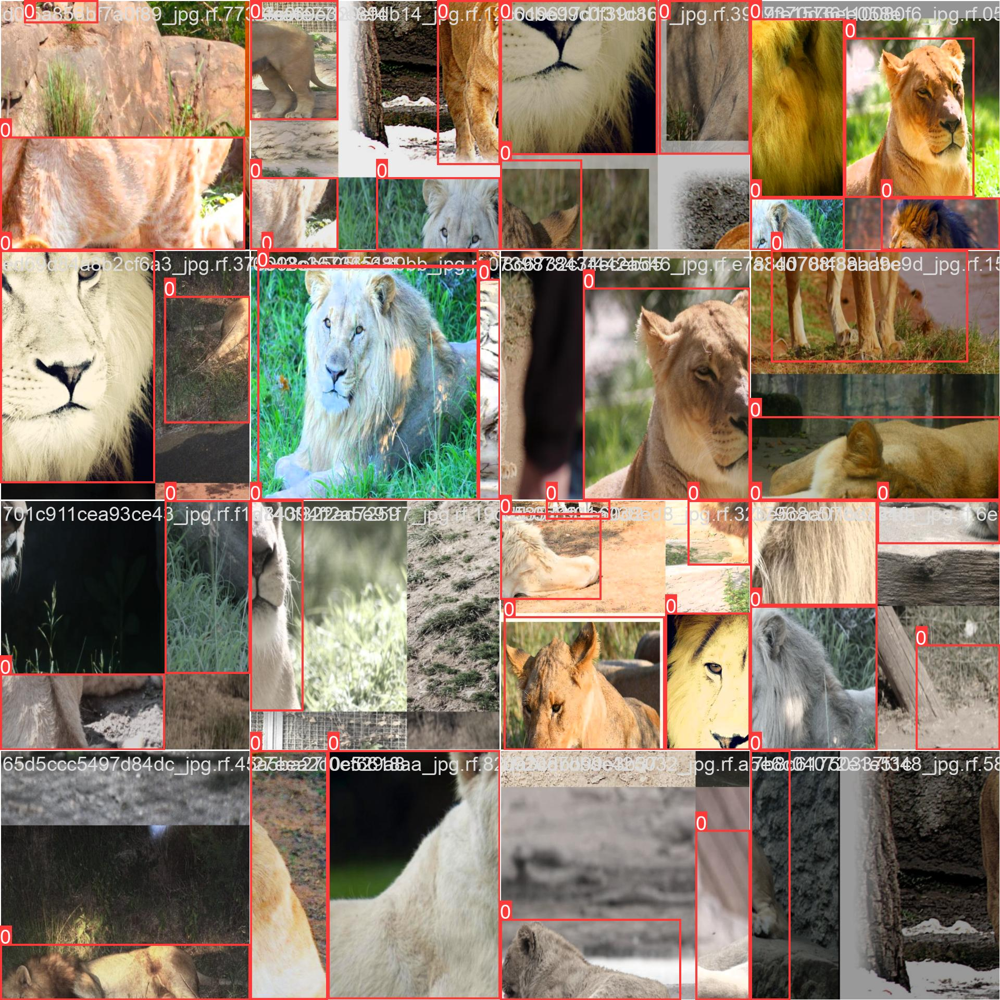

In [35]:
train_batch = cv2.imread('/content/runs/detect/train2/train_batch2.jpg')

cv2_imshow(train_batch)

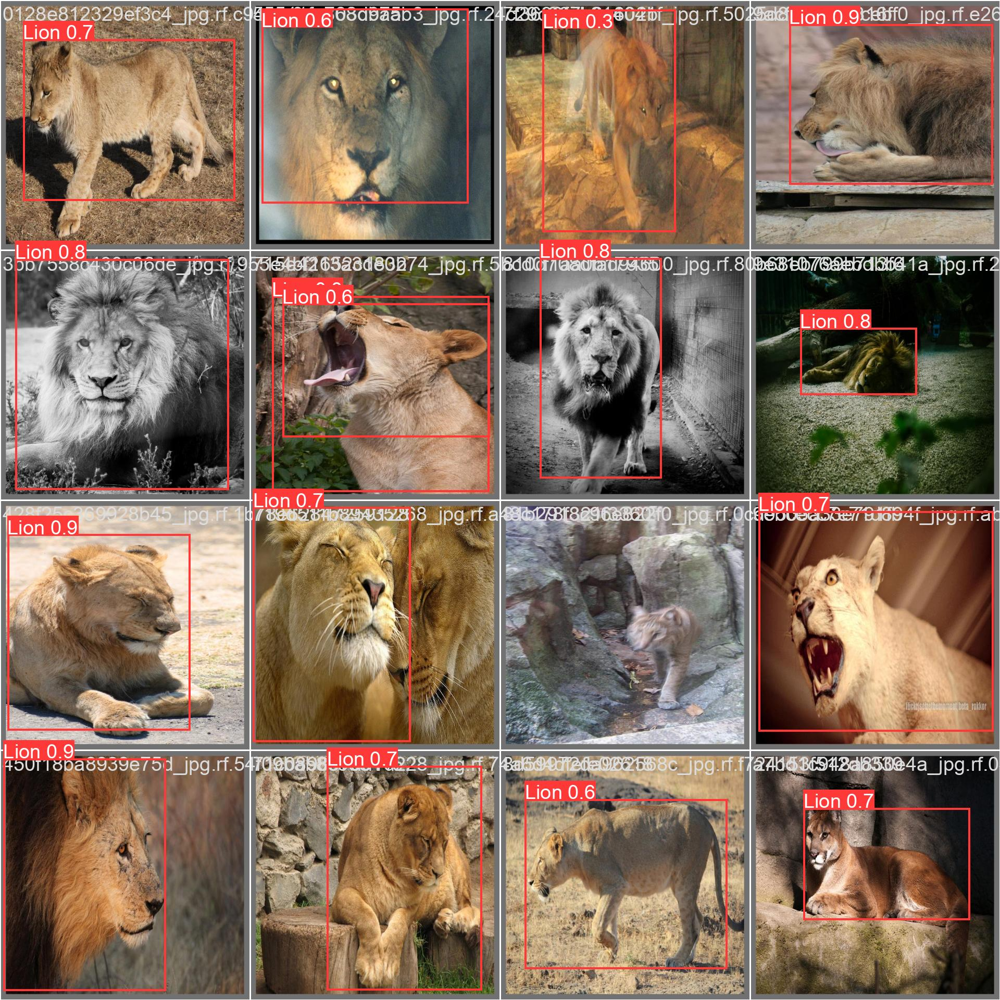

In [34]:
val_batch = cv2.imread('/content/runs/detect/train2/val_batch0_pred.jpg')

cv2_imshow(val_batch)

In [36]:
model.val('/content/my-datasets/data.yaml')

Ultralytics YOLOv8.0.159 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients
val: Scanning /content/my-datasets/valid/labels.cache... 61 images, 0 backgrounds, 0 corrupt: 100%|██████████| 61/61 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.19it/s]
                   all         61         63      0.941      0.873      0.956      0.745
Speed: 11.4ms preprocess, 7.5ms inference, 0.0ms loss, 3.6ms postprocess per image
Results saved to runs/detect/val2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x790647499f60>
fitness: 0.765836234700519
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.74469])
names: {0: 'Lion'}
plot: True
results_dict: {'metrics/precision(B)': 0.9411769385232404, 'metrics/recall(B)': 0.873015873015873, 'metrics/mAP50(B)': 0.9561077768995432, 'metrics/mAP50-95(B)': 0.7446949522339608, 'fitness': 0.765836234700519}
save_dir: PosixPath('runs/detect/val2')
speed: {'preprocess': 11.404854352356956, 'inference': 7.516896138425733, 'loss': 0.0018995316302190062, 'postprocess': 3.6450487668396994}

In [39]:
image = cv2.imread('/content/my-datasets/test/images/4b356e74c4f14ef8_jpg.rf.c0f2737064ab941bb8dfd59ac0f47f56.jpg')
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

results = model.predict(source=image)


0: 640x640 2 Lions, 12.8ms
Speed: 2.1ms preprocess, 12.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


Object type: Lion
Coordinates: [9, 84, 640, 629]
Probability: 0.69
---
Object type: Lion
Coordinates: [12, 101, 640, 468]
Probability: 0.39
---


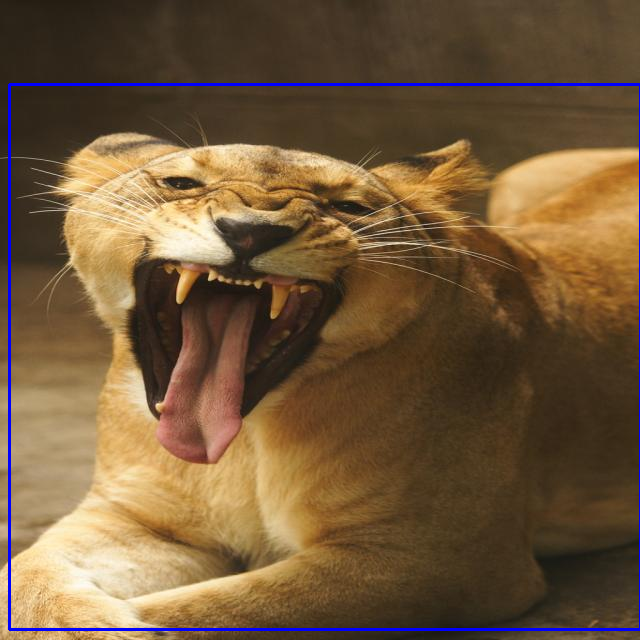

In [40]:
for i in range(len(results)):
  result = results[i]

  for box in result.boxes:
    class_id = result.names[box.cls[0].item()]
    cords = box.xyxy[0].tolist()
    cords = [round(x) for x in cords]
    conf = round(box.conf[0].item(), 2)
    print("Object type:", class_id)
    print("Coordinates:", cords)
    print("Probability:", conf)

    x1, y1, x2, y2 = cords
    if conf > 0.5:
      cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)

    print("---")

cv2_imshow(image)

In [17]:
x1, y1, x2, y2 = cords
print(y1)

403
